<a href="https://colab.research.google.com/github/nguyenanhtienabcd/AIO2024_EXERCISE/blob/feature%2FMODULE7-WEEK1/m07w01_ex3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Khoa_LHR_image.zip
!gdown --id 1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3



/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3
From (redirected): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3&confirm=t&uuid=41ffe956-95a6-48d4-a87b-47cc82c1abda
To: /content/Khoa_LHR_image.zip
100% 89.0M/89.0M [00:01<00:00, 69.7MB/s]


In [2]:
!pip install torcheval


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 6.7 MB/s eta 0:00:00


In [3]:
!unzip /content/Khoa_LHR_image.zip

Archive:  /content/Khoa_LHR_image.zip
   creating: Khoa_LHR_image/
   creating: Khoa_LHR_image/train/
  inflating: Khoa_LHR_image/train/0.png  
  inflating: Khoa_LHR_image/train/1.png  
  inflating: Khoa_LHR_image/train/10.png  
  inflating: Khoa_LHR_image/train/100.png  
  inflating: Khoa_LHR_image/train/101.png  
  inflating: Khoa_LHR_image/train/102.png  
  inflating: Khoa_LHR_image/train/103.png  
  inflating: Khoa_LHR_image/train/104.png  
  inflating: Khoa_LHR_image/train/105.png  
  inflating: Khoa_LHR_image/train/106.png  
  inflating: Khoa_LHR_image/train/107.png  
  inflating: Khoa_LHR_image/train/108.png  
  inflating: Khoa_LHR_image/train/109.png  
  inflating: Khoa_LHR_image/train/11.png  
  inflating: Khoa_LHR_image/train/110.png  
  inflating: Khoa_LHR_image/train/111.png  
  inflating: Khoa_LHR_image/train/112.png  
  inflating: Khoa_LHR_image/train/113.png  
  inflating: Khoa_LHR_image/train/114.png  
  inflating: Khoa_LHR_image/train/115.png  
  inflating: Khoa_LHR_im

In [4]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torch import optim
from PIL import Image
from torchvision import transforms
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from torcheval.metrics.functional import peak_signal_noise_ratio
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(66)


## Problem3: Inpainting Image with UNET

### Unet for inpainting image task

#### No skip connection

In [5]:
class FirstFeatureNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeatureNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlockNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlockNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class EncoderNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super(EncoderNoSkip, self).__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlockNoSkip(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class DecoderNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels*2, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels*2),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlockNoSkip(out_channels*2, out_channels)

    def forward(self, x):
        x = self.conv(x)
        x = self.conv_block(x)
        return x


class FinalOutputNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutputNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class II_Unet_NoSkip(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3
    ):
        super(II_Unet_NoSkip, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.in_conv1 = FirstFeatureNoSkip(n_channels, 64)
        self.in_conv2 = ConvBlockNoSkip(64, 64)

        self.enc_1 = EncoderNoSkip(64, 128)
        self.enc_2 = EncoderNoSkip(128, 256)
        self.enc_3 = EncoderNoSkip(256, 512)
        self.enc_4 = EncoderNoSkip(512, 1024)

        self.dec_1 = DecoderNoSkip(1024, 512)
        self.dec_2 = DecoderNoSkip(512, 256)
        self.dec_3 = DecoderNoSkip(256, 128)
        self.dec_4 = DecoderNoSkip(128, 64)

        self.out_conv = FinalOutputNoSkip(64, n_classes)


    def forward(self, x):
        x = self.in_conv1(x)
        x = self.in_conv2(x)

        x = self.enc_1(x)
        x = self.enc_2(x)
        x = self.enc_3(x)
        x = self.enc_4(x)

        x = self.dec_1(x)
        x = self.dec_2(x)
        x = self.dec_3(x)
        x = self.dec_4(x)

        x = self.out_conv(x)
        return x

In [6]:
unet_model = II_Unet_NoSkip().to(device)
img = torch.ones(2, 3, 256, 256).to(device)
unet_model(img).shape

torch.Size([2, 3, 256, 256])

#### Skip connection

In [7]:
class FirstFeature(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeature, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlock(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Decoder, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x, skip):
        x = self.conv(x)
        x = torch.concat([x, skip], dim=1)
        x = self.conv_block(x)
        return x


class FinalOutput(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutput, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class II_Unet(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3, features=[64, 128, 256, 512],
    ):
        super(II_Unet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes

        self.in_conv1 = FirstFeature(n_channels, 64)
        self.in_conv2 = ConvBlock(64, 64)

        self.enc_1 = Encoder(64, 128)
        self.enc_2 = Encoder(128, 256)
        self.enc_3 = Encoder(256, 512)
        self.enc_4 = Encoder(512, 1024)

        self.dec_1 = Decoder(1024, 512)
        self.dec_2 = Decoder(512, 256)
        self.dec_3 = Decoder(256, 128)
        self.dec_4 = Decoder(128, 64)

        self.out_conv = FinalOutput(64, n_classes)


    def forward(self, x):
        x = self.in_conv1(x)
        x1 = self.in_conv2(x)

        x2 = self.enc_1(x1)
        x3 = self.enc_2(x2)
        x4 = self.enc_3(x3)
        x5 = self.enc_4(x4)

        x = self.dec_1(x5, x4)
        x = self.dec_2(x, x3)
        x = self.dec_3(x, x2)
        x = self.dec_4(x, x1)

        x = self.out_conv(x)
        return x

In [8]:
unet_model = II_Unet().to(device)
img = torch.ones(2, 3, 256, 256).to(device)
unet_model(img).shape

torch.Size([2, 3, 256, 256])

### Prepare Inpainting Dataset

In [9]:
LHR_TRAIN_DATA_PATH = '/content/Khoa_LHR_image/train'
LHR_VAL_DATA_PATH = '/content/Khoa_LHR_image/val'
BATCH_SIZE = 8
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [10]:
class ImageDataset(Dataset):
    """
    Các bạn dựa vào idea hướng dẫn trong file mô tả bài hãy xây dựng một hàm load data
    cho bài toán Image Inpainting (input_image=256x256 và target_image=256x256 ảnh màu).
    Các bạn có thể tự do xây dựng theo từng cá nhân, có thể add thêm hoặc xoá các method không
    cần thiết. Hoặc các bạn có thể tham khảo code hướng dẫn trong file mô tả bài tập
    """
    def __init__(self, img_dir, is_train=True):
        self.is_train = is_train
        self.img_dir = img_dir
        self.images = os.listdir(img_dir)


    def __len__(self):
      return len(self.images)

    def normalize(self, input_image, target_image):
        input_image  = input_image*2 - 1
        target_image = target_image*2 - 1

        return input_image, target_image


    def random_jitter(self, input_image, target_image):
      if torch.rand([]) < 0.5:
        input_image = transforms.functional.hflip(input_image)
        target_image = transforms.functional.hflip(target_image)

      return input_image, target_image


    def create_mask(self, image):
        masked_image = image.copy()
        ## Prepare masking matrix
        mask = np.full((IMG_WIDTH,IMG_HEIGHT,3), 0, np.uint8)
        for _ in range(np.random.randint(1,5)):
            # Get random x locations to start line
            x1, x2 = np.random.randint(1, IMG_WIDTH), np.random.randint(1, IMG_WIDTH)
            y1, y2 = np.random.randint(1, IMG_HEIGHT), np.random.randint(1, IMG_HEIGHT)
            # Get random thickness of the line drawn
            thickness = np.random.randint(1,15)
            # Draw line on the black mask
            cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

        masked_image = np.where(mask, 255*np.ones_like(mask), masked_image)
        return masked_image

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = np.array(Image.open(img_path).convert("RGB"))
        input_image = self.create_mask(image)
        input_image = transforms.functional.to_tensor(input_image)
        target_image = transforms.functional.to_tensor(image)

        input_image = input_image.type(torch.float32)
        target_image = target_image.type(torch.float32)

        input_image, target_image = self.normalize(input_image, target_image)
        if self.is_train:
            input_image, target_image = self.random_jitter(input_image, target_image)

        return input_image, target_image



In [11]:
train_dataset = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = ImageDataset(LHR_VAL_DATA_PATH, is_train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Text(0.5, 1.0, 'Target')

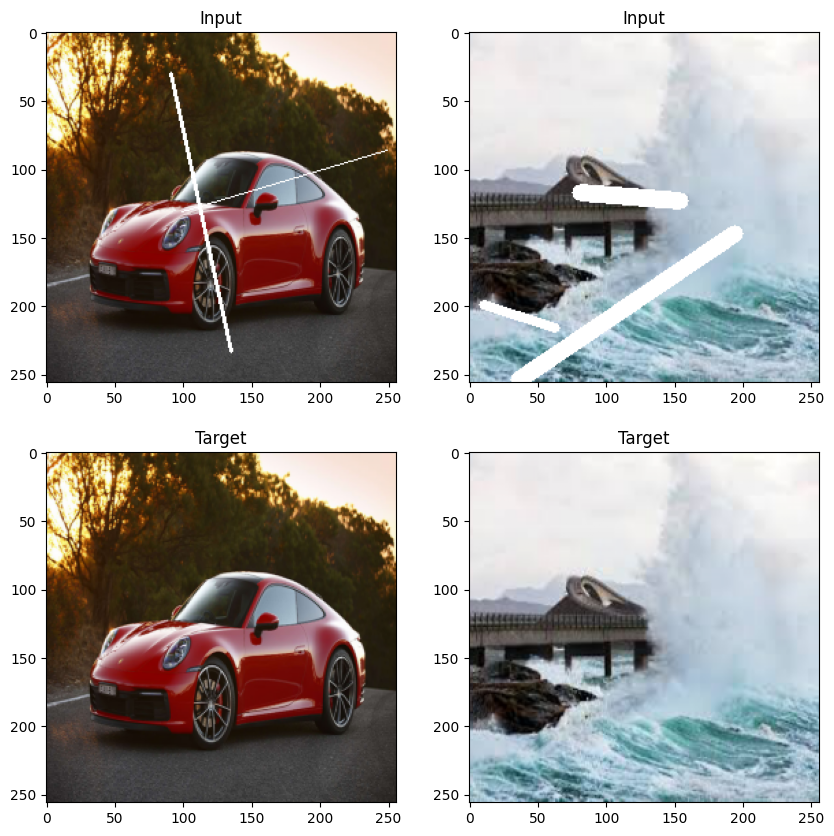

In [12]:
in_batch, tar_batch = next(iter(train_loader))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")



### Train

In [13]:
def generate_images(model, inputs, labels):
    model.eval()
    with torch.no_grad():
        inputs, labels = inputs.to(device), labels.to(device)
        predictions = model(inputs)
    inputs, labels, predictions = inputs.cpu().numpy(), labels.cpu().numpy(), predictions.cpu().numpy()
    plt.figure(figsize=(15,20))

    display_list = [inputs[-1].transpose((1, 2, 0)), labels[-1].transpose((1, 2, 0)), predictions[-1].transpose((1, 2, 0))]
    title = ['Input', 'Real', 'Predicted']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow((display_list[i] + 1) / 2)
        plt.axis('off')
    plt.show()

In [14]:
import time

def train_epoch(model, optimizer, criterion, train_dataloader, device, epoch=0, log_interval=50):
    model.train()
    total_psnr, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()

        total_psnr += peak_signal_noise_ratio(predictions, labels)
        total_count += 1
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| psnr {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_psnr / total_count
                )
            )
            total_psnr, total_count = 0, 0
            start_time = time.time()

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [15]:
def evaluate_epoch(model, criterion, valid_dataloader, device):
    model.eval()
    total_psnr, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            predictions = model(inputs)

            loss = criterion(predictions, labels)
            losses.append(loss.item())


            total_psnr +=  peak_signal_noise_ratio(predictions, labels)
            total_count += 1

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [16]:
def train(model, model_name, save_model, optimizer, criterion, train_dataloader, valid_dataloader, num_epochs, device):
    train_psnrs, train_losses = [], []
    eval_psnrs, eval_losses = [], []
    best_psnr_eval = -1000
    times = []
    for epoch in range(1, num_epochs+1):
        epoch_start_time = time.time()
        # Training
        train_psnr, train_loss = train_epoch(model, optimizer, criterion, train_dataloader, device, epoch)
        train_psnrs.append(train_psnr.cpu())
        train_losses.append(train_loss)

        # Evaluation
        eval_psnr, eval_loss = evaluate_epoch(model, criterion, valid_dataloader, device)
        eval_psnrs.append(eval_psnr.cpu())
        eval_losses.append(eval_loss)

        # Save best model
        if best_psnr_eval < eval_psnr:
            torch.save(model.state_dict(), save_model + f'/{model_name}.pt')
            inputs_t, targets_t = next(iter(valid_dataloader))
            generate_images(model, inputs_t, targets_t)
            best_psnr_eval = eval_psnr
        times.append(time.time() - epoch_start_time)
        # Print loss, psnr end epoch
        print("-" * 59)
        print(
            "| End of epoch {:3d} | Time: {:5.2f}s | Train psnr {:8.3f} | Train Loss {:8.3f} "
            "| Valid psnr {:8.3f} | Valid Loss {:8.3f} ".format(
                epoch, time.time() - epoch_start_time, train_psnr, train_loss, eval_psnr, eval_loss
            )
        )
        print("-" * 59)

    # Load best model
    model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))
    model.eval()
    metrics = {
        'train_psnr': train_psnrs,
        'train_loss': train_losses,
        'valid_psnr': eval_psnrs,
        'valid_loss': eval_losses,
        'time': times
    }
    return model, metrics

In [17]:
import matplotlib.pyplot as plt

def plot_result(num_epochs, train_psnrs, eval_psnrs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_psnrs, label = "Training")
    axs[0].plot(epochs, eval_psnrs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("PSNR")
    axs[1].set_ylabel("Loss")
    plt.legend()

In [18]:
import matplotlib.pyplot as plt

def predict_and_display(model, test_dataloader, device):
    model.eval()

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(test_dataloader):
            if idx >= 10:
                break
            inputs = inputs.to(device)
            predictions = model(inputs)
            generate_images(model, inputs, labels)
            plt.show()





#### Unet No Skip Connection

| epoch   1 |    50/   86 batches | psnr   14.102


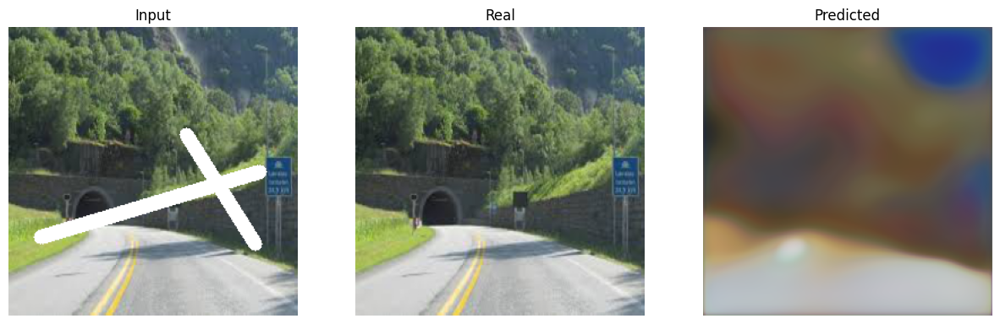

-----------------------------------------------------------
| End of epoch   1 | Time: 54.67s | Train psnr   15.517 | Train Loss    0.268 | Valid psnr   14.750 | Valid Loss    0.253 
-----------------------------------------------------------
| epoch   2 |    50/   86 batches | psnr   15.733


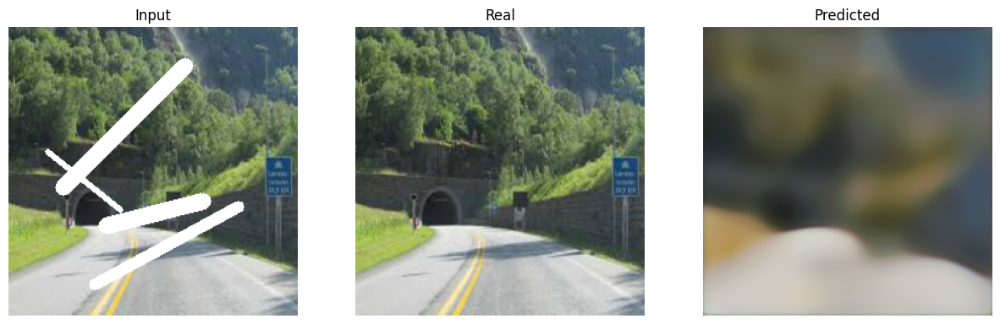

-----------------------------------------------------------
| End of epoch   2 | Time: 59.87s | Train psnr   16.496 | Train Loss    0.218 | Valid psnr   16.397 | Valid Loss    0.198 
-----------------------------------------------------------
| epoch   3 |    50/   86 batches | psnr   16.017
-----------------------------------------------------------
| End of epoch   3 | Time: 59.96s | Train psnr   16.174 | Train Loss    0.218 | Valid psnr   16.069 | Valid Loss    0.229 
-----------------------------------------------------------
| epoch   4 |    50/   86 batches | psnr   16.277


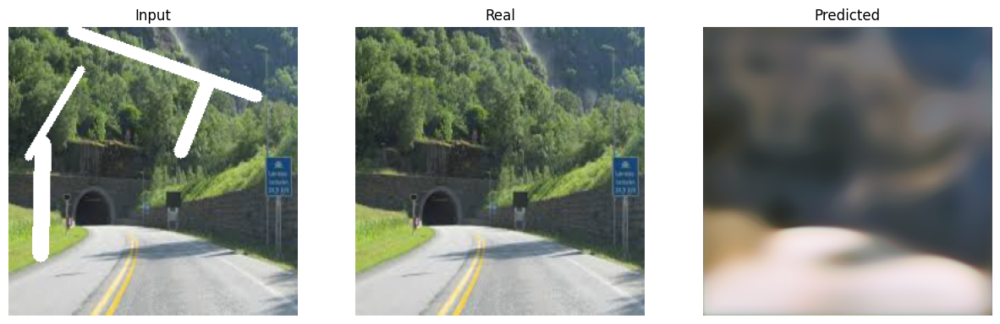

-----------------------------------------------------------
| End of epoch   4 | Time: 61.28s | Train psnr   17.125 | Train Loss    0.204 | Valid psnr   17.142 | Valid Loss    0.190 
-----------------------------------------------------------
| epoch   5 |    50/   86 batches | psnr   17.014
-----------------------------------------------------------
| End of epoch   5 | Time: 59.98s | Train psnr   16.237 | Train Loss    0.199 | Valid psnr   16.853 | Valid Loss    0.198 
-----------------------------------------------------------
| epoch   6 |    50/   86 batches | psnr   17.070


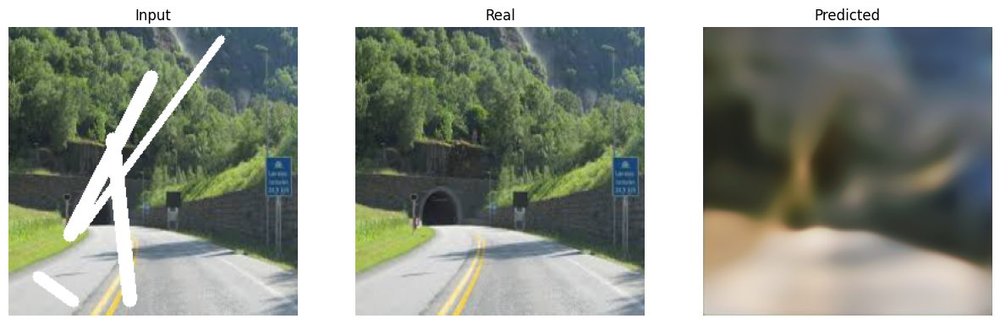

-----------------------------------------------------------
| End of epoch   6 | Time: 61.03s | Train psnr   17.354 | Train Loss    0.188 | Valid psnr   17.432 | Valid Loss    0.179 
-----------------------------------------------------------
| epoch   7 |    50/   86 batches | psnr   17.390
-----------------------------------------------------------
| End of epoch   7 | Time: 60.30s | Train psnr   17.768 | Train Loss    0.177 | Valid psnr   16.043 | Valid Loss    0.200 
-----------------------------------------------------------
| epoch   8 |    50/   86 batches | psnr   17.583
-----------------------------------------------------------
| End of epoch   8 | Time: 60.24s | Train psnr   18.007 | Train Loss    0.173 | Valid psnr   17.321 | Valid Loss    0.177 
-----------------------------------------------------------
| epoch   9 |    50/   86 batches | psnr   17.632
-----------------------------------------------------------
| End of epoch   9 | Time: 60.18s | Train psnr   17.447 | Tra

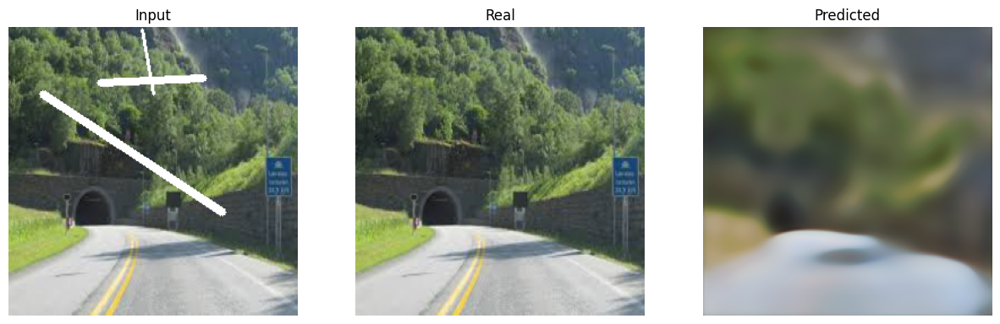

-----------------------------------------------------------
| End of epoch  10 | Time: 61.02s | Train psnr   17.838 | Train Loss    0.168 | Valid psnr   17.769 | Valid Loss    0.174 
-----------------------------------------------------------
| epoch  11 |    50/   86 batches | psnr   18.064
-----------------------------------------------------------
| End of epoch  11 | Time: 60.40s | Train psnr   18.288 | Train Loss    0.164 | Valid psnr   17.629 | Valid Loss    0.168 
-----------------------------------------------------------
| epoch  12 |    50/   86 batches | psnr   18.404
-----------------------------------------------------------
| End of epoch  12 | Time: 60.23s | Train psnr   18.216 | Train Loss    0.160 | Valid psnr   16.755 | Valid Loss    0.199 
-----------------------------------------------------------
| epoch  13 |    50/   86 batches | psnr   18.272


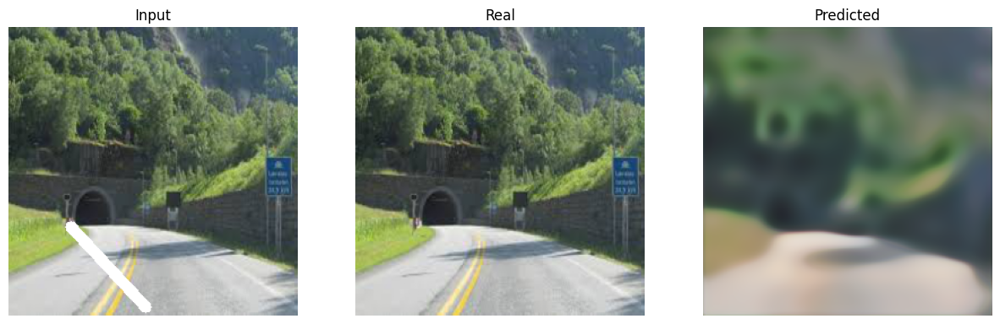

-----------------------------------------------------------
| End of epoch  13 | Time: 61.24s | Train psnr   18.624 | Train Loss    0.158 | Valid psnr   18.495 | Valid Loss    0.160 
-----------------------------------------------------------
| epoch  14 |    50/   86 batches | psnr   18.607
-----------------------------------------------------------
| End of epoch  14 | Time: 60.31s | Train psnr   18.262 | Train Loss    0.157 | Valid psnr   17.391 | Valid Loss    0.178 
-----------------------------------------------------------
| epoch  15 |    50/   86 batches | psnr   18.458
-----------------------------------------------------------
| End of epoch  15 | Time: 60.15s | Train psnr   18.509 | Train Loss    0.158 | Valid psnr   18.483 | Valid Loss    0.160 
-----------------------------------------------------------
| epoch  16 |    50/   86 batches | psnr   18.826


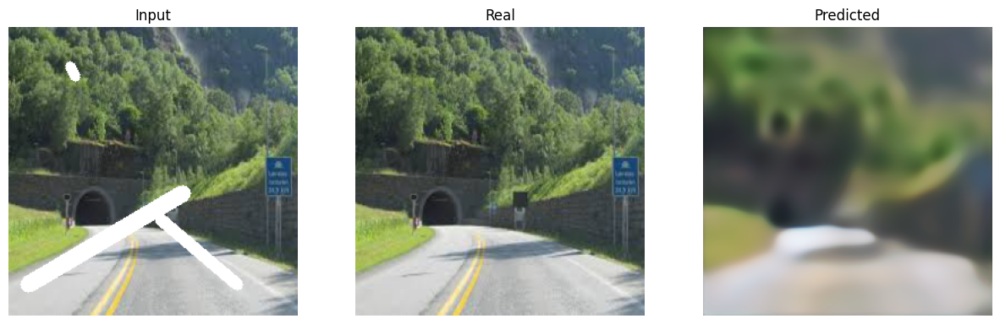

-----------------------------------------------------------
| End of epoch  16 | Time: 60.87s | Train psnr   18.720 | Train Loss    0.151 | Valid psnr   18.744 | Valid Loss    0.150 
-----------------------------------------------------------
| epoch  17 |    50/   86 batches | psnr   18.934
-----------------------------------------------------------
| End of epoch  17 | Time: 60.31s | Train psnr   18.574 | Train Loss    0.150 | Valid psnr   18.656 | Valid Loss    0.147 
-----------------------------------------------------------
| epoch  18 |    50/   86 batches | psnr   18.730
-----------------------------------------------------------
| End of epoch  18 | Time: 60.38s | Train psnr   18.915 | Train Loss    0.150 | Valid psnr   18.700 | Valid Loss    0.147 
-----------------------------------------------------------
| epoch  19 |    50/   86 batches | psnr   19.063
-----------------------------------------------------------
| End of epoch  19 | Time: 60.26s | Train psnr   18.969 | Tra

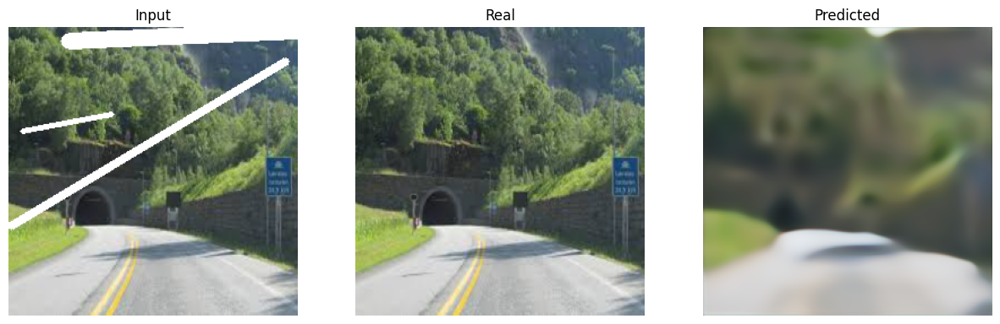

-----------------------------------------------------------
| End of epoch  21 | Time: 60.97s | Train psnr   19.183 | Train Loss    0.142 | Valid psnr   19.234 | Valid Loss    0.139 
-----------------------------------------------------------
| epoch  22 |    50/   86 batches | psnr   19.149
-----------------------------------------------------------
| End of epoch  22 | Time: 60.34s | Train psnr   19.545 | Train Loss    0.140 | Valid psnr   18.858 | Valid Loss    0.143 
-----------------------------------------------------------
| epoch  23 |    50/   86 batches | psnr   19.386


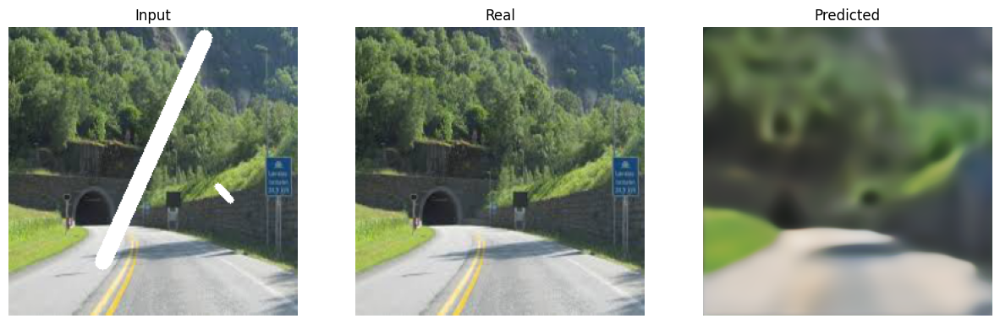

-----------------------------------------------------------
| End of epoch  23 | Time: 61.14s | Train psnr   19.334 | Train Loss    0.140 | Valid psnr   19.257 | Valid Loss    0.142 
-----------------------------------------------------------
| epoch  24 |    50/   86 batches | psnr   19.557
-----------------------------------------------------------
| End of epoch  24 | Time: 60.08s | Train psnr   19.252 | Train Loss    0.139 | Valid psnr   18.625 | Valid Loss    0.153 
-----------------------------------------------------------
| epoch  25 |    50/   86 batches | psnr   19.675
-----------------------------------------------------------
| End of epoch  25 | Time: 60.33s | Train psnr   18.551 | Train Loss    0.143 | Valid psnr   15.097 | Valid Loss    0.245 
-----------------------------------------------------------
| epoch  26 |    50/   86 batches | psnr   19.217
-----------------------------------------------------------
| End of epoch  26 | Time: 60.15s | Train psnr   19.462 | Tra

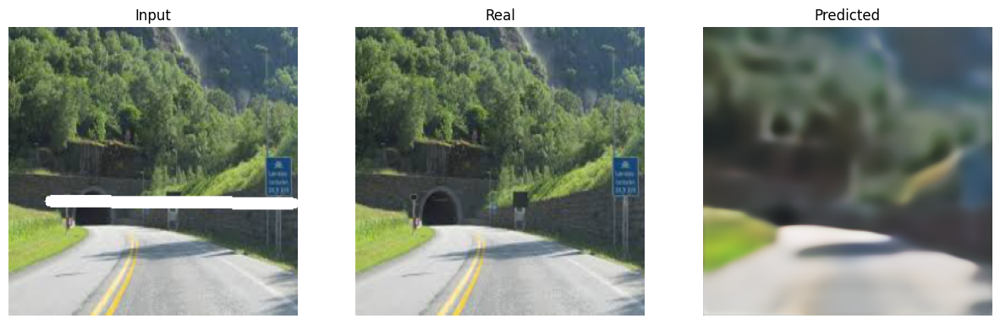

-----------------------------------------------------------
| End of epoch  29 | Time: 61.12s | Train psnr   19.798 | Train Loss    0.132 | Valid psnr   19.497 | Valid Loss    0.132 
-----------------------------------------------------------
| epoch  30 |    50/   86 batches | psnr   19.849


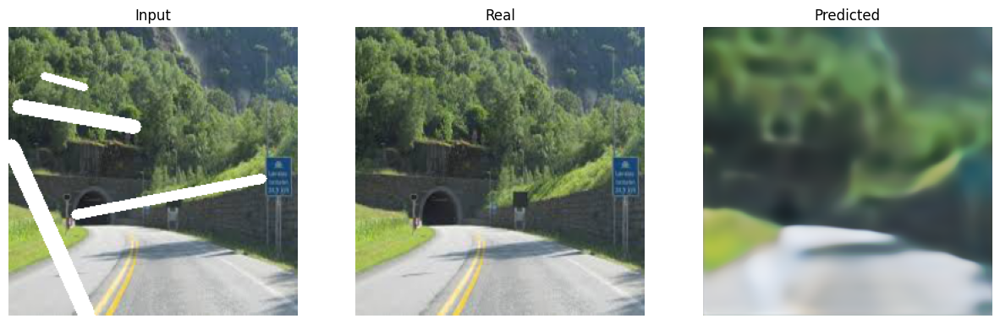

-----------------------------------------------------------
| End of epoch  30 | Time: 61.47s | Train psnr   19.680 | Train Loss    0.132 | Valid psnr   19.782 | Valid Loss    0.128 
-----------------------------------------------------------
| epoch  31 |    50/   86 batches | psnr   19.478
-----------------------------------------------------------
| End of epoch  31 | Time: 60.28s | Train psnr   19.179 | Train Loss    0.139 | Valid psnr   18.323 | Valid Loss    0.155 
-----------------------------------------------------------
| epoch  32 |    50/   86 batches | psnr   19.747
-----------------------------------------------------------
| End of epoch  32 | Time: 60.22s | Train psnr   19.989 | Train Loss    0.130 | Valid psnr   18.670 | Valid Loss    0.151 
-----------------------------------------------------------
| epoch  33 |    50/   86 batches | psnr   19.736
-----------------------------------------------------------
| End of epoch  33 | Time: 60.10s | Train psnr   19.942 | Tra

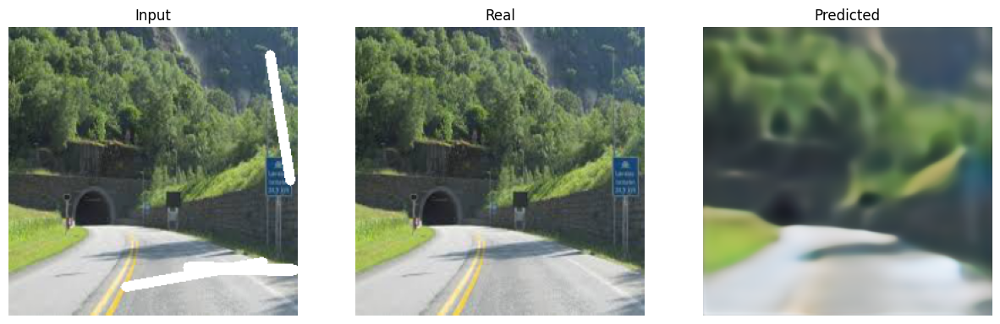

-----------------------------------------------------------
| End of epoch  43 | Time: 61.20s | Train psnr   20.236 | Train Loss    0.125 | Valid psnr   20.090 | Valid Loss    0.124 
-----------------------------------------------------------
| epoch  44 |    50/   86 batches | psnr   20.294
-----------------------------------------------------------
| End of epoch  44 | Time: 60.13s | Train psnr   20.389 | Train Loss    0.123 | Valid psnr   19.786 | Valid Loss    0.129 
-----------------------------------------------------------
| epoch  45 |    50/   86 batches | psnr   20.297


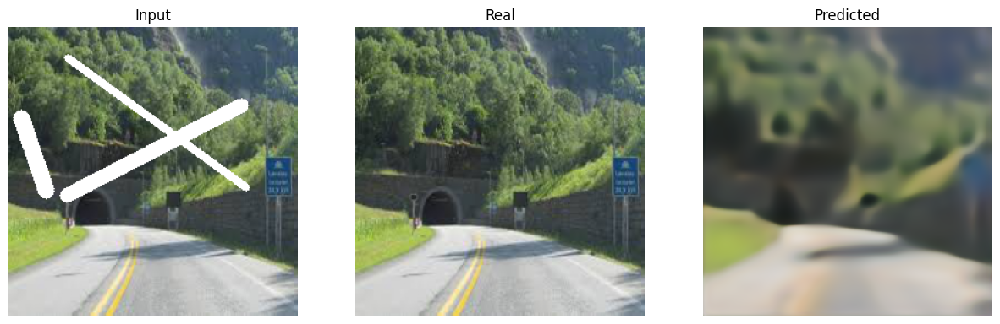

-----------------------------------------------------------
| End of epoch  45 | Time: 61.31s | Train psnr   20.462 | Train Loss    0.122 | Valid psnr   20.349 | Valid Loss    0.121 
-----------------------------------------------------------
| epoch  46 |    50/   86 batches | psnr   20.250
-----------------------------------------------------------
| End of epoch  46 | Time: 60.41s | Train psnr   20.804 | Train Loss    0.120 | Valid psnr   19.984 | Valid Loss    0.127 
-----------------------------------------------------------
| epoch  47 |    50/   86 batches | psnr   20.580
-----------------------------------------------------------
| End of epoch  47 | Time: 60.18s | Train psnr   20.510 | Train Loss    0.120 | Valid psnr   20.219 | Valid Loss    0.123 
-----------------------------------------------------------
| epoch  48 |    50/   86 batches | psnr   20.401
-----------------------------------------------------------
| End of epoch  48 | Time: 60.14s | Train psnr   20.663 | Tra

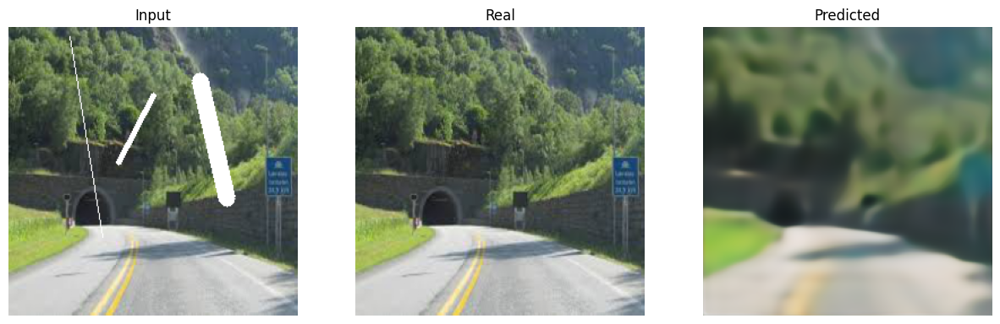

-----------------------------------------------------------
| End of epoch  50 | Time: 60.93s | Train psnr   20.660 | Train Loss    0.117 | Valid psnr   20.579 | Valid Loss    0.117 
-----------------------------------------------------------
| epoch  51 |    50/   86 batches | psnr   20.748
-----------------------------------------------------------
| End of epoch  51 | Time: 60.24s | Train psnr   20.513 | Train Loss    0.118 | Valid psnr   20.020 | Valid Loss    0.127 
-----------------------------------------------------------
| epoch  52 |    50/   86 batches | psnr   20.625
-----------------------------------------------------------
| End of epoch  52 | Time: 60.25s | Train psnr   20.772 | Train Loss    0.117 | Valid psnr   19.617 | Valid Loss    0.143 
-----------------------------------------------------------
| epoch  53 |    50/   86 batches | psnr   20.729
-----------------------------------------------------------
| End of epoch  53 | Time: 60.17s | Train psnr   20.524 | Tra

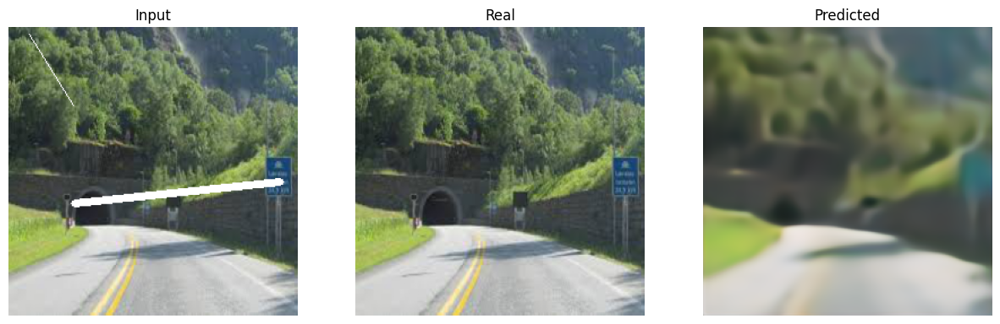

-----------------------------------------------------------
| End of epoch  57 | Time: 61.33s | Train psnr   20.831 | Train Loss    0.115 | Valid psnr   20.723 | Valid Loss    0.113 
-----------------------------------------------------------
| epoch  58 |    50/   86 batches | psnr   20.909
-----------------------------------------------------------
| End of epoch  58 | Time: 60.22s | Train psnr   21.071 | Train Loss    0.112 | Valid psnr   20.490 | Valid Loss    0.120 
-----------------------------------------------------------
| epoch  59 |    50/   86 batches | psnr   20.829
-----------------------------------------------------------
| End of epoch  59 | Time: 60.12s | Train psnr   21.146 | Train Loss    0.113 | Valid psnr   20.135 | Valid Loss    0.123 
-----------------------------------------------------------
| epoch  60 |    50/   86 batches | psnr   20.776
-----------------------------------------------------------
| End of epoch  60 | Time: 60.27s | Train psnr   20.714 | Tra

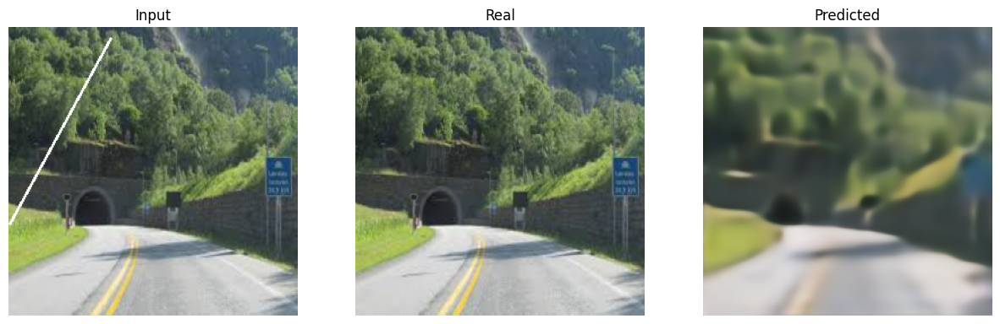

-----------------------------------------------------------
| End of epoch  65 | Time: 61.07s | Train psnr   21.083 | Train Loss    0.111 | Valid psnr   20.978 | Valid Loss    0.110 
-----------------------------------------------------------
| epoch  66 |    50/   86 batches | psnr   21.275
-----------------------------------------------------------
| End of epoch  66 | Time: 60.26s | Train psnr   21.003 | Train Loss    0.110 | Valid psnr   19.887 | Valid Loss    0.130 
-----------------------------------------------------------
| epoch  67 |    50/   86 batches | psnr   21.043
-----------------------------------------------------------
| End of epoch  67 | Time: 60.41s | Train psnr   21.074 | Train Loss    0.112 | Valid psnr   20.436 | Valid Loss    0.116 
-----------------------------------------------------------
| epoch  68 |    50/   86 batches | psnr   21.038
-----------------------------------------------------------
| End of epoch  68 | Time: 60.28s | Train psnr   21.183 | Tra

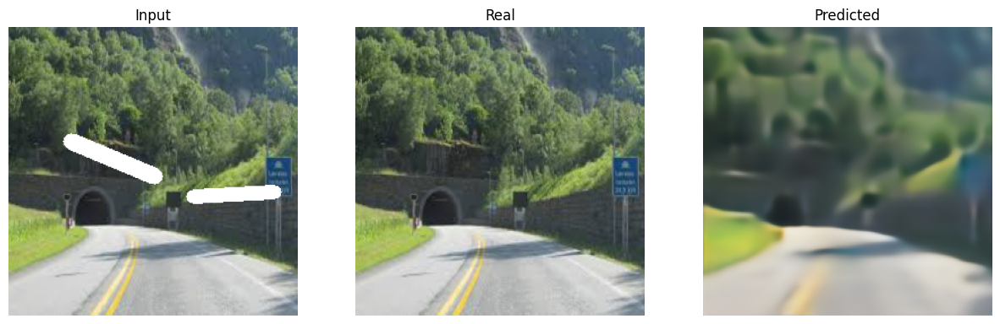

-----------------------------------------------------------
| End of epoch  79 | Time: 61.26s | Train psnr   21.313 | Train Loss    0.105 | Valid psnr   21.012 | Valid Loss    0.110 
-----------------------------------------------------------
| epoch  80 |    50/   86 batches | psnr   20.871
-----------------------------------------------------------
| End of epoch  80 | Time: 60.05s | Train psnr   20.881 | Train Loss    0.115 | Valid psnr   19.845 | Valid Loss    0.135 
-----------------------------------------------------------
| epoch  81 |    50/   86 batches | psnr   21.241
-----------------------------------------------------------
| End of epoch  81 | Time: 60.24s | Train psnr   21.492 | Train Loss    0.108 | Valid psnr   20.584 | Valid Loss    0.120 
-----------------------------------------------------------
| epoch  82 |    50/   86 batches | psnr   21.363
-----------------------------------------------------------
| End of epoch  82 | Time: 60.15s | Train psnr   21.447 | Tra

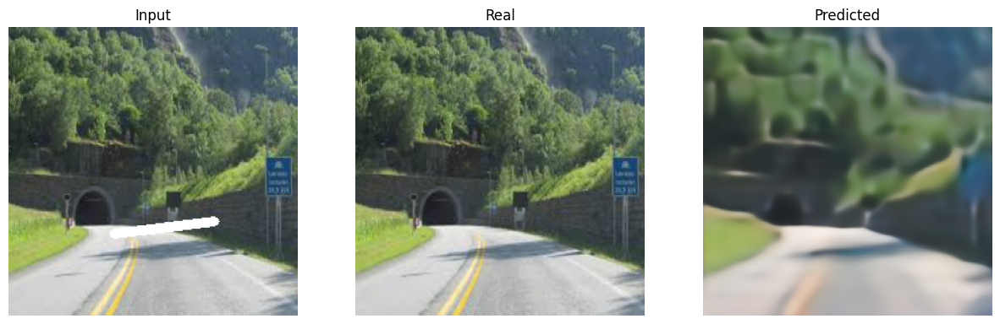

-----------------------------------------------------------
| End of epoch  88 | Time: 61.25s | Train psnr   21.491 | Train Loss    0.106 | Valid psnr   21.212 | Valid Loss    0.108 
-----------------------------------------------------------
| epoch  89 |    50/   86 batches | psnr   21.520
-----------------------------------------------------------
| End of epoch  89 | Time: 60.34s | Train psnr   21.577 | Train Loss    0.105 | Valid psnr   20.903 | Valid Loss    0.112 
-----------------------------------------------------------
| epoch  90 |    50/   86 batches | psnr   21.564
-----------------------------------------------------------
| End of epoch  90 | Time: 60.34s | Train psnr   21.431 | Train Loss    0.106 | Valid psnr   21.187 | Valid Loss    0.106 
-----------------------------------------------------------
| epoch  91 |    50/   86 batches | psnr   21.701
-----------------------------------------------------------
| End of epoch  91 | Time: 60.24s | Train psnr   21.398 | Tra

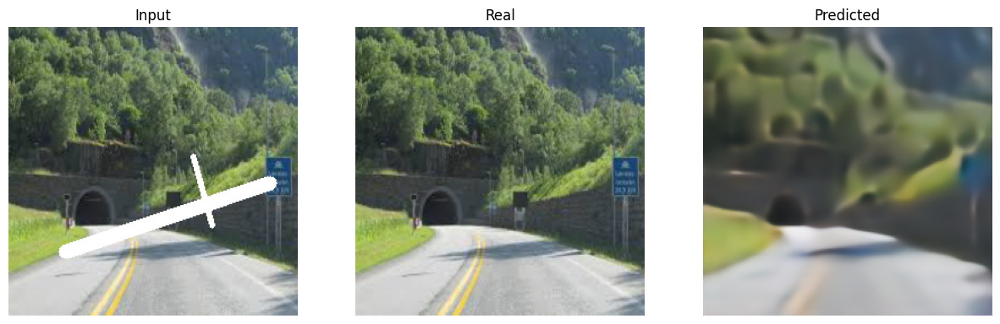

-----------------------------------------------------------
| End of epoch  93 | Time: 61.37s | Train psnr   21.680 | Train Loss    0.104 | Valid psnr   21.246 | Valid Loss    0.106 
-----------------------------------------------------------
| epoch  94 |    50/   86 batches | psnr   21.608
-----------------------------------------------------------
| End of epoch  94 | Time: 60.28s | Train psnr   20.476 | Train Loss    0.111 | Valid psnr   20.821 | Valid Loss    0.118 
-----------------------------------------------------------
| epoch  95 |    50/   86 batches | psnr   21.116
-----------------------------------------------------------
| End of epoch  95 | Time: 60.28s | Train psnr   21.710 | Train Loss    0.108 | Valid psnr   21.081 | Valid Loss    0.108 
-----------------------------------------------------------
| epoch  96 |    50/   86 batches | psnr   21.688
-----------------------------------------------------------
| End of epoch  96 | Time: 60.38s | Train psnr   21.525 | Tra

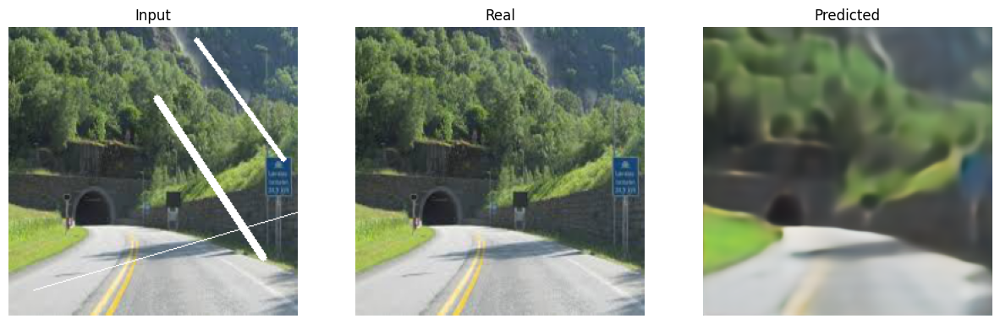

-----------------------------------------------------------
| End of epoch  97 | Time: 61.45s | Train psnr   21.806 | Train Loss    0.101 | Valid psnr   21.267 | Valid Loss    0.105 
-----------------------------------------------------------
| epoch  98 |    50/   86 batches | psnr   21.598
-----------------------------------------------------------
| End of epoch  98 | Time: 60.37s | Train psnr   21.841 | Train Loss    0.103 | Valid psnr   21.219 | Valid Loss    0.105 
-----------------------------------------------------------
| epoch  99 |    50/   86 batches | psnr   21.732
-----------------------------------------------------------
| End of epoch  99 | Time: 60.36s | Train psnr   21.595 | Train Loss    0.103 | Valid psnr   21.001 | Valid Loss    0.107 
-----------------------------------------------------------
| epoch 100 |    50/   86 batches | psnr   21.696
-----------------------------------------------------------
| End of epoch 100 | Time: 60.12s | Train psnr   21.791 | Tra

<ipython-input-16-1b4dce1feef3>:36: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))


In [19]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IP_unet_model_noskip = II_Unet_NoSkip().to(device)
IP_unet_model_noskip.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model_noskip.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
IP_unet_model_noskip, metrics = train(
    IP_unet_model_noskip, 'IP_unet_model_noskip', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

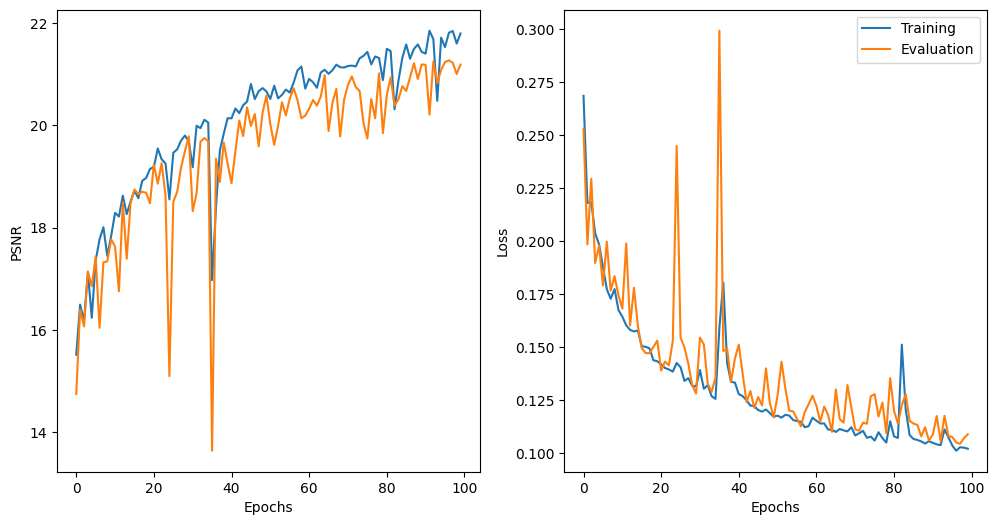

In [20]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [21]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model_noskip, criterion, test_loader, device)
test_psnr, test_loss

(tensor(21.2689, device='cuda:0'), 0.10515277189287273)

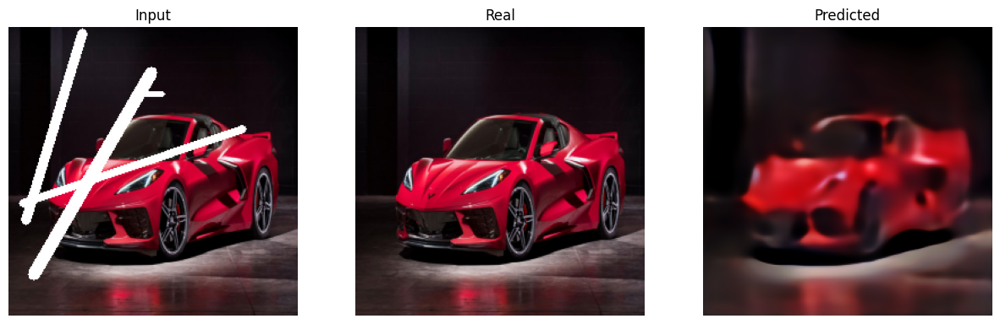

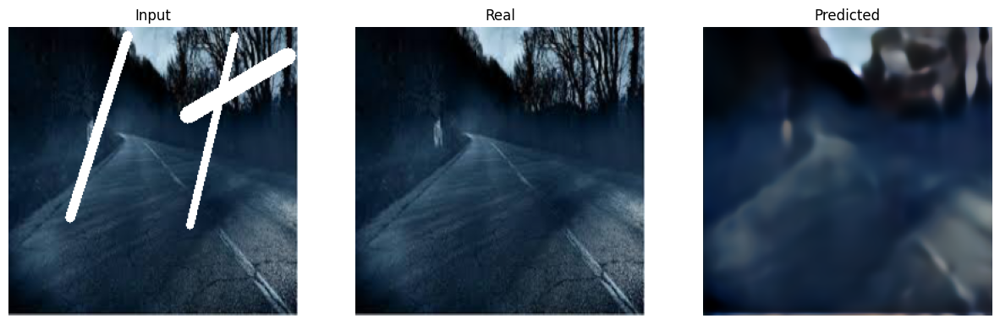

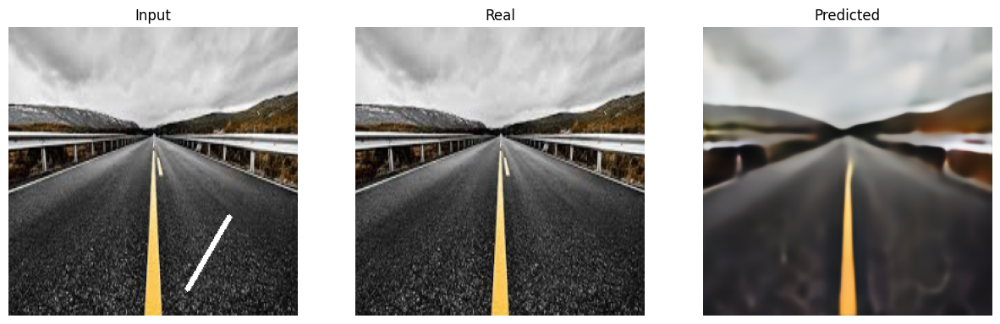

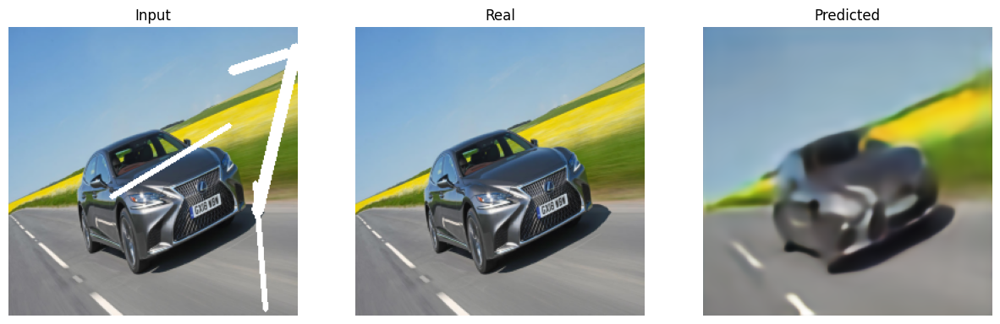

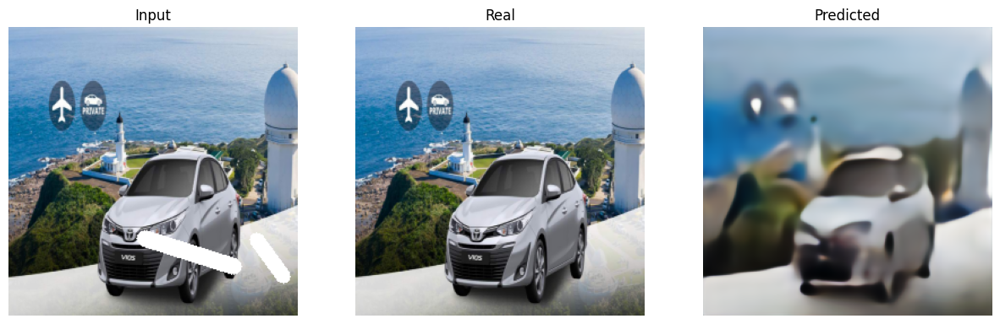

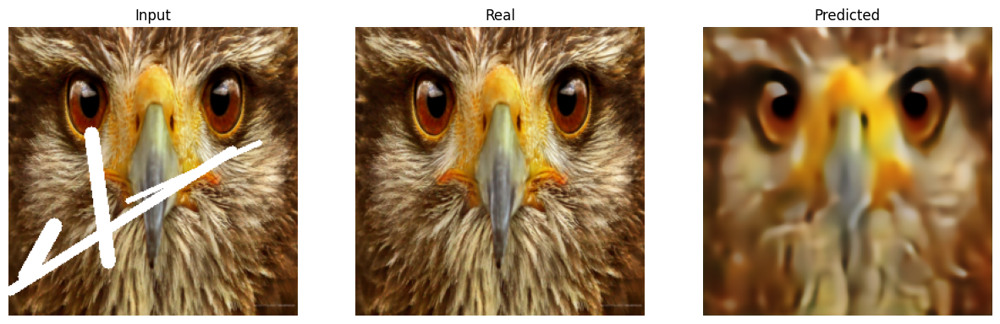

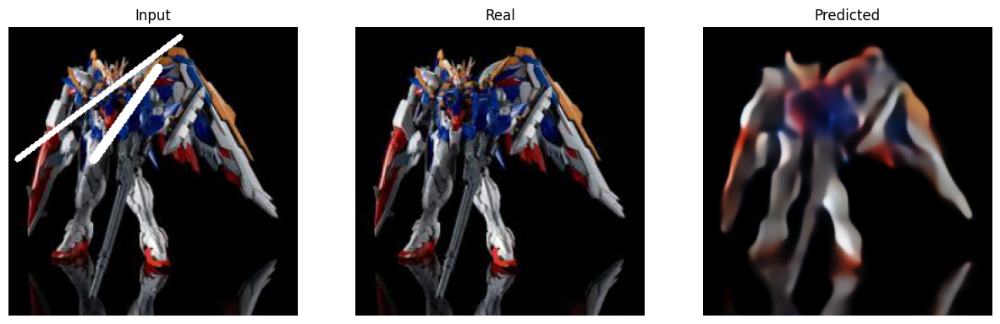

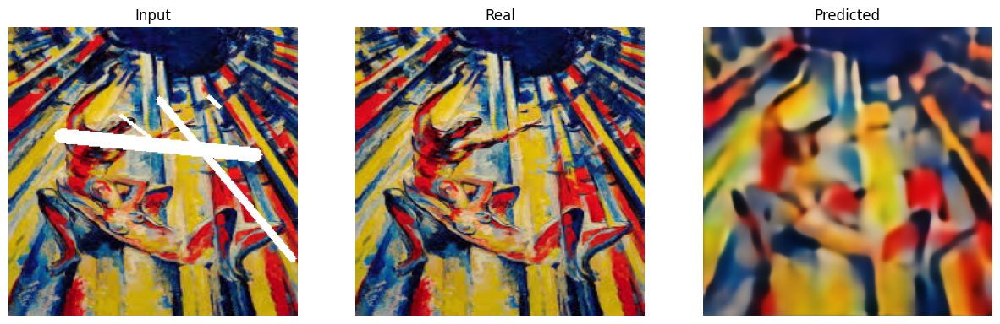

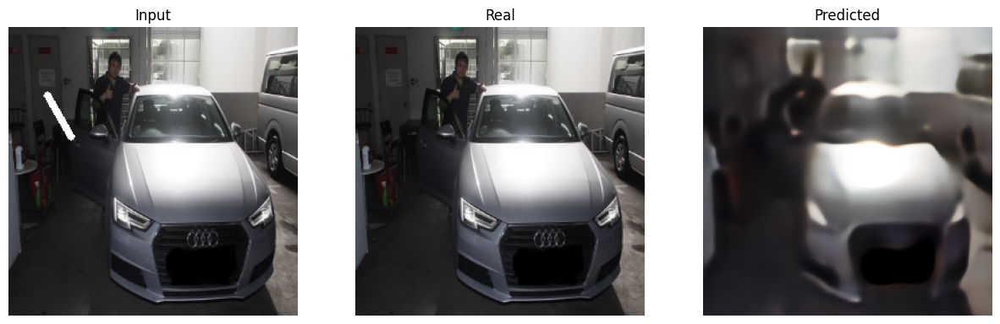

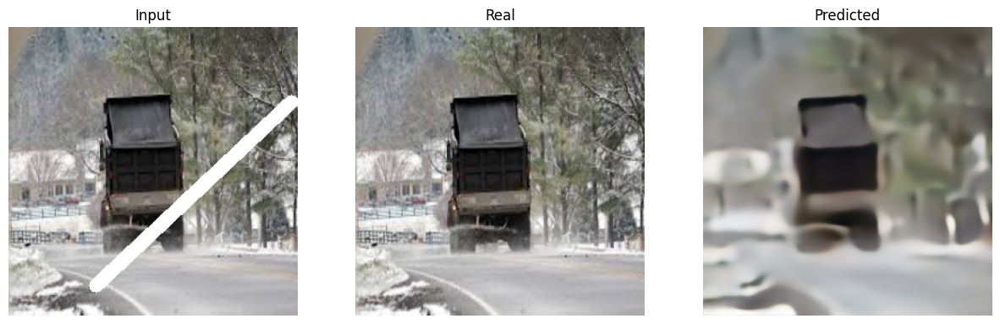

In [22]:
predict_and_display(IP_unet_model_noskip, train_loader, device)

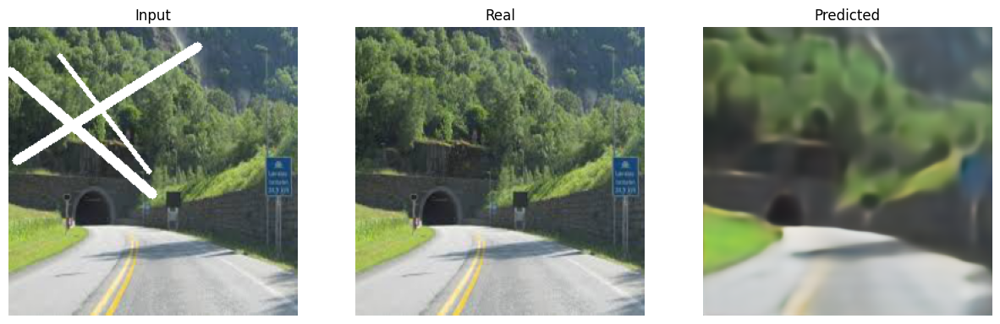

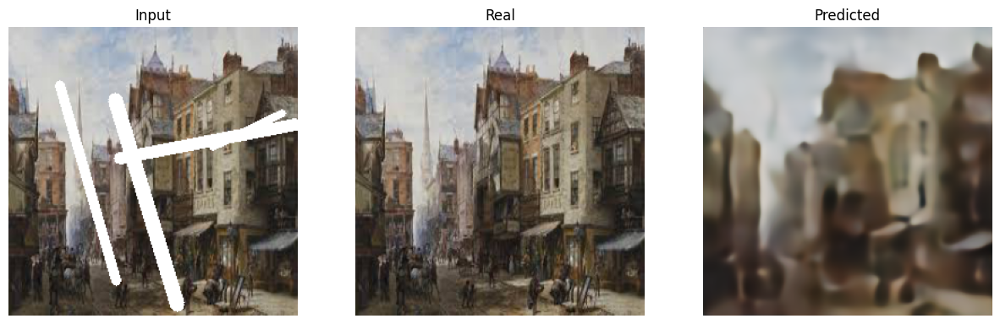

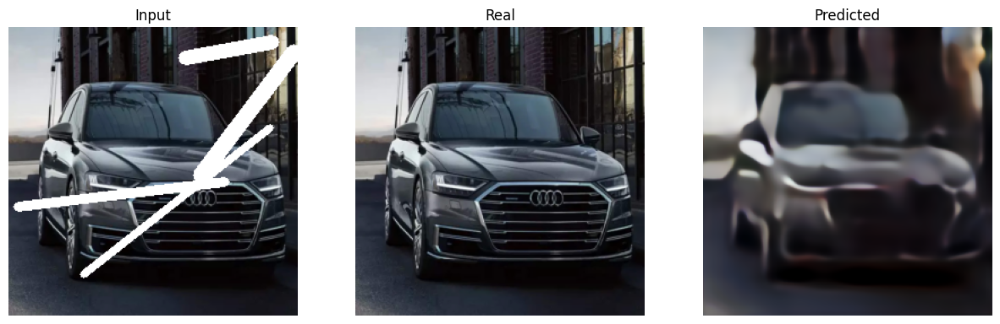

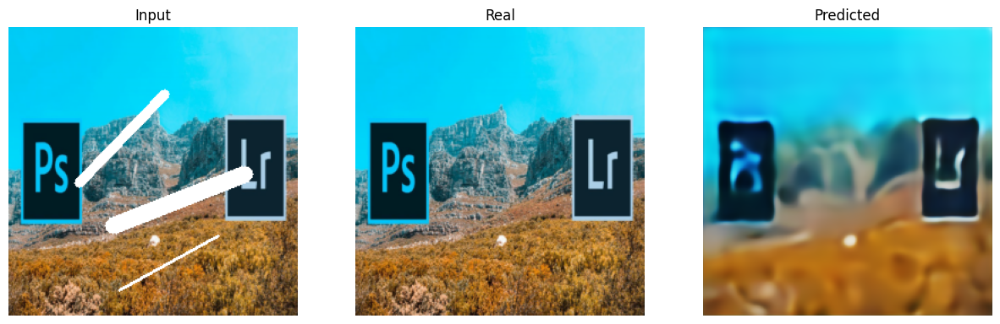

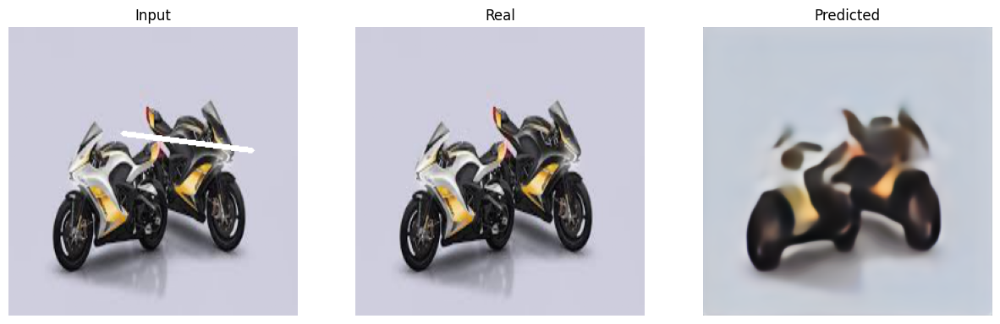

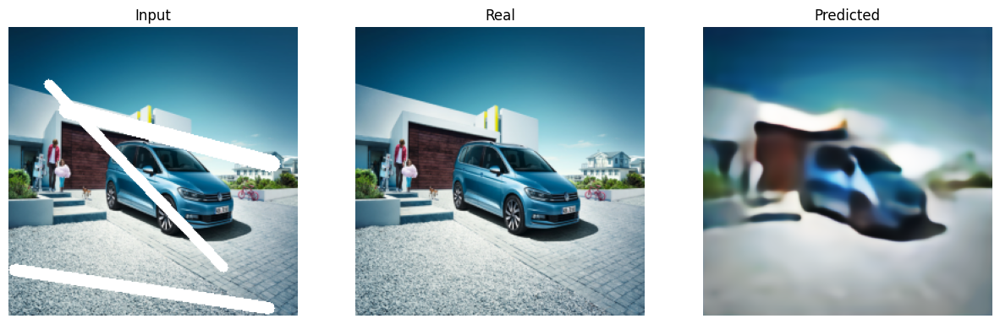

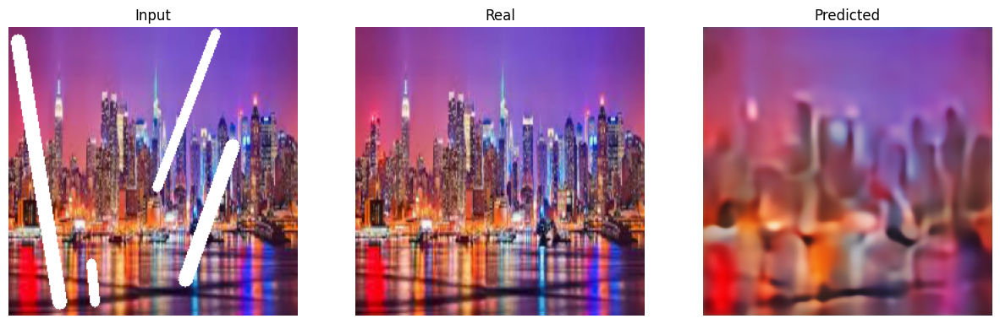

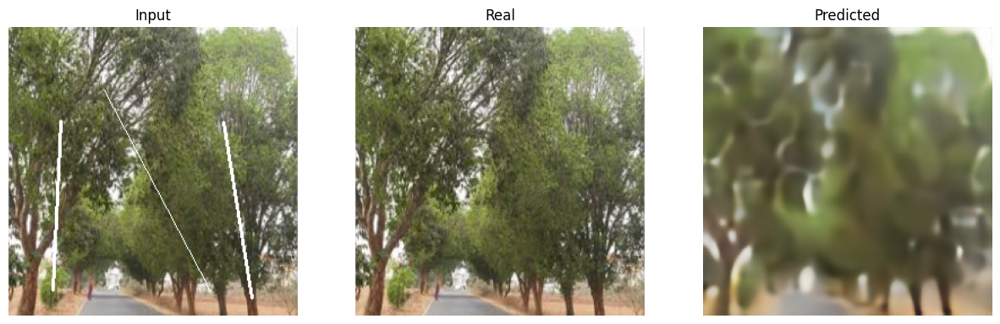

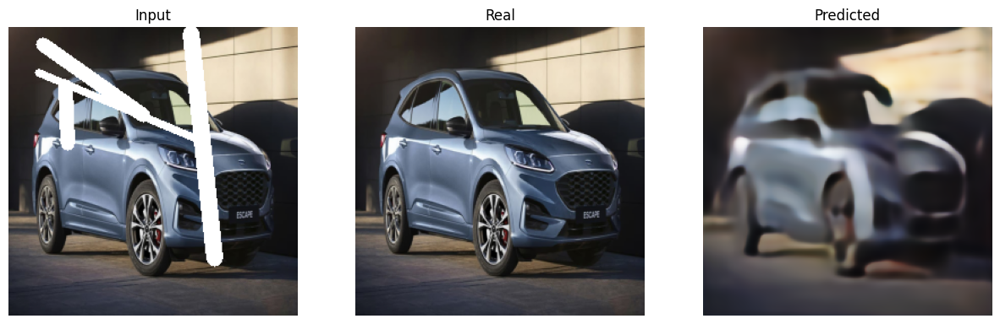

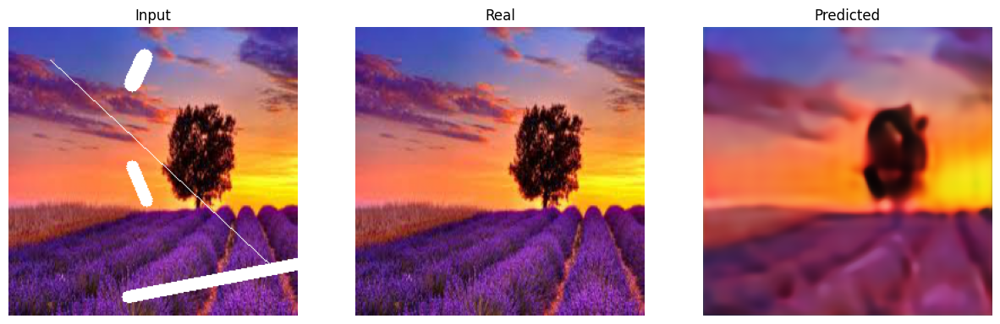

In [23]:
predict_and_display(IP_unet_model_noskip, test_loader, device)

#### Unet

In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IP_unet_model = II_Unet().to(device)
IP_unet_model.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
IP_unet_model, metrics = train(
    IP_unet_model, 'IP_unet_model', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model, criterion, test_loader, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model, train_loader, device)

In [ ]:
predict_and_display(IP_unet_model, test_loader, device)

#### Unet Pretrained

In [ ]:
LHR_TRAIN_DATA_PATH = './Khoa_LHR_image/train'
LHR_VAL_DATA_PATH = './Khoa_LHR_image/val'
BATCH_SIZE = 8
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, img_dir, is_train=True, is_phase1=False):
        self.is_phase1 = is_phase1
        self.is_train = is_train
        self.img_dir = img_dir
        self.images = os.listdir(img_dir)

    def __len__(self):
        return len(self.images)

    def normalize(self, input_image, target_image):
        input_image  = input_image*2 - 1
        target_image = target_image*2 - 1

        return input_image, target_image

    def random_jitter(self, input_image, target_image):
        if torch.rand([]) < 0.5:
            input_image = transforms.functional.hflip(input_image)
            target_image = transforms.functional.hflip(target_image)

        return input_image, target_image


# tạo ngẫy nhiên các đoạn thẳng mong muốn (1-4 đoạn)
    def create_mask(self, image):
        masked_image = image.copy()
        ## Prepare masking matrix
        mask = np.full((IMG_WIDTH,IMG_HEIGHT,3), 0, np.uint8)
        for _ in range(np.random.randint(1, 5)):
            # Get random x locations to start line
            x1, x2 = np.random.randint(1, IMG_WIDTH), np.random.randint(1, IMG_WIDTH)
            # Get random y locations to start line
            y1, y2 = np.random.randint(1, IMG_HEIGHT), np.random.randint(1, IMG_HEIGHT)
            # Get random thickness of the line drawn
            thickness = np.random.randint(1, 15)
            # Draw line on the black mask
            cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

        masked_image = np.where(mask, 255*np.ones_like(mask), masked_image)
        return masked_image

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = np.array(Image.open(img_path).convert("RGB"))

        if self.is_phase1:
            image = transforms.functional.to_tensor(image)
            input_image, target_image = self.normalize(image, image)
            input_image, target_image = input_image.type(torch.float32), target_image.type(torch.float32)
            if self.is_train:
                input_image, target_image = self.random_jitter(input_image, target_image)
            return input_image, target_image

        input_image = self.create_mask(image)
        input_image = transforms.functional.to_tensor(input_image)
        target_image = transforms.functional.to_tensor(image)

        input_image = input_image.type(torch.float32)
        target_image = target_image.type(torch.float32)

        input_image, target_image = self.normalize(input_image, target_image)

        if self.is_train:
            input_image, target_image = self.random_jitter(input_image, target_image)

        return input_image, target_image



In [ ]:
train_dataset_phase1 = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True, is_phase1=True)
train_loader_phase1 = DataLoader(train_dataset_phase1, batch_size=BATCH_SIZE, shuffle=True)

test_dataset_phase1 = ImageDataset(LHR_VAL_DATA_PATH, is_train=False, is_phase1=True)
test_loader_phase1 = DataLoader(test_dataset_phase1, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
in_batch, tar_batch = next(iter(train_loader_phase1))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")



In [ ]:
train_dataset = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = ImageDataset(LHR_VAL_DATA_PATH, is_train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
in_batch, tar_batch = next(iter(train_loader))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")



In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IP_unet_model = II_Unet().to(device)
IP_unet_model.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
IP_unet_model, metrics = train(
    IP_unet_model, 'IP_unet_model_phase1', save_model, optimizer, criterion, train_loader_phase1, test_loader_phase1, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model, criterion, test_loader_phase1, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model, train_loader_phase1, device)

In [ ]:
predict_and_display(IP_unet_model, test_loader_phase1, device)

In [ ]:
criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

EPOCHS = 100
IP_unet_model, metrics = train(
    IP_unet_model, 'IP_unet_model_phase2', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

## Problem3: Inpainting Image with UNET

### Unet for inpainting image task

#### No skip connection

In [ ]:
class FirstFeatureNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeatureNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlockNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlockNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class EncoderNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super(EncoderNoSkip, self).__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlockNoSkip(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class DecoderNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels*2, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels*2),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlockNoSkip(out_channels*2, out_channels)

    def forward(self, x):
        x = self.conv(x)
        x = self.conv_block(x)
        return x


class FinalOutputNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutputNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class II_Unet_NoSkip(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3
    ):
        super(II_Unet_NoSkip, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.in_conv1 = FirstFeatureNoSkip(n_channels, 64)
        self.in_conv2 = ConvBlockNoSkip(64, 64)

        self.enc_1 = EncoderNoSkip(64, 128)
        self.enc_2 = EncoderNoSkip(128, 256)
        self.enc_3 = EncoderNoSkip(256, 512)
        self.enc_4 = EncoderNoSkip(512, 1024)

        self.dec_1 = DecoderNoSkip(1024, 512)
        self.dec_2 = DecoderNoSkip(512, 256)
        self.dec_3 = DecoderNoSkip(256, 128)
        self.dec_4 = DecoderNoSkip(128, 64)

        self.out_conv = FinalOutputNoSkip(64, n_classes)


    def forward(self, x):
        x = self.in_conv1(x)
        x = self.in_conv2(x)

        x = self.enc_1(x)
        x = self.enc_2(x)
        x = self.enc_3(x)
        x = self.enc_4(x)

        x = self.dec_1(x)
        x = self.dec_2(x)
        x = self.dec_3(x)
        x = self.dec_4(x)

        x = self.out_conv(x)
        return x

In [ ]:
unet_model = II_Unet_NoSkip().to(device)
img = torch.ones(2, 3, 256, 256).to(device)
unet_model(img).shape

#### Skip connection

In [ ]:
class FirstFeature(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeature, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlock(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Decoder, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x, skip):
        x = self.conv(x)
        x = torch.concat([x, skip], dim=1)
        x = self.conv_block(x)
        return x


class FinalOutput(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutput, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class II_Unet(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3, features=[64, 128, 256, 512],
    ):
        super(II_Unet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes

        self.in_conv1 = FirstFeature(n_channels, 64)
        self.in_conv2 = ConvBlock(64, 64)

        self.enc_1 = Encoder(64, 128)
        self.enc_2 = Encoder(128, 256)
        self.enc_3 = Encoder(256, 512)
        self.enc_4 = Encoder(512, 1024)

        self.dec_1 = Decoder(1024, 512)
        self.dec_2 = Decoder(512, 256)
        self.dec_3 = Decoder(256, 128)
        self.dec_4 = Decoder(128, 64)

        self.out_conv = FinalOutput(64, n_classes)


    def forward(self, x):
        x = self.in_conv1(x)
        x1 = self.in_conv2(x)

        x2 = self.enc_1(x1)
        x3 = self.enc_2(x2)
        x4 = self.enc_3(x3)
        x5 = self.enc_4(x4)

        x = self.dec_1(x5, x4)
        x = self.dec_2(x, x3)
        x = self.dec_3(x, x2)
        x = self.dec_4(x, x1)

        x = self.out_conv(x)
        return x

In [ ]:
unet_model = II_Unet().to(device)
img = torch.ones(2, 3, 256, 256).to(device)
unet_model(img).shape

### Prepare Inpainting Dataset

In [ ]:
LHR_TRAIN_DATA_PATH = '/content/Khoa_LHR_image/train'
LHR_VAL_DATA_PATH = '/content/Khoa_LHR_image/val'
BATCH_SIZE = 8
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, img_dir, is_train=True, is_phase1=False):
        self.is_phase1 = is_phase1
        self.is_train = is_train
        self.img_dir = img_dir
        self.images = os.listdir(img_dir)

    def __len__(self):
        return len(self.images)

    def normalize(self, input_image, target_image):
        input_image  = input_image*2 - 1
        target_image = target_image*2 - 1

        return input_image, target_image

    def random_jitter(self, input_image, target_image):
        if torch.rand([]) < 0.5:
            input_image = transforms.functional.hflip(input_image)
            target_image = transforms.functional.hflip(target_image)

        return input_image, target_image


# tạo ngẫy nhiên các đoạn thẳng mong muốn (1-4 đoạn)
    def create_mask(self, image):
        masked_image = image.copy()
        ## Prepare masking matrix
        mask = np.full((IMG_WIDTH,IMG_HEIGHT,3), 0, np.uint8)
        for _ in range(np.random.randint(1, 5)):
            # Get random x locations to start line
            x1, x2 = np.random.randint(1, IMG_WIDTH), np.random.randint(1, IMG_WIDTH)
            # Get random y locations to start line
            y1, y2 = np.random.randint(1, IMG_HEIGHT), np.random.randint(1, IMG_HEIGHT)
            # Get random thickness of the line drawn
            thickness = np.random.randint(1, 15)
            # Draw line on the black mask
            cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

        masked_image = np.where(mask, 255*np.ones_like(mask), masked_image)
        return masked_image

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = np.array(Image.open(img_path).convert("RGB"))

        if self.is_phase1:
            image = transforms.functional.to_tensor(image)
            input_image, target_image = self.normalize(image, image)
            input_image, target_image = input_image.type(torch.float32), target_image.type(torch.float32)
            if self.is_train:
                input_image, target_image = self.random_jitter(input_image, target_image)
            return input_image, target_image

        input_image = self.create_mask(image)
        input_image = transforms.functional.to_tensor(input_image)
        target_image = transforms.functional.to_tensor(image)

        input_image = input_image.type(torch.float32)
        target_image = target_image.type(torch.float32)

        input_image, target_image = self.normalize(input_image, target_image)

        if self.is_train:
            input_image, target_image = self.random_jitter(input_image, target_image)

        return input_image, target_image



In [ ]:
train_dataset = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = ImageDataset(LHR_VAL_DATA_PATH, is_train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
in_batch, tar_batch = next(iter(train_loader))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")



### Train

In [ ]:
def generate_images(model, inputs, labels):
    model.eval()
    with torch.no_grad():
        inputs, labels = inputs.to(device), labels.to(device)
        predictions = model(inputs)
    inputs, labels, predictions = inputs.cpu().numpy(), labels.cpu().numpy(), predictions.cpu().numpy()
    plt.figure(figsize=(15,20))

    display_list = [inputs[-1].transpose((1, 2, 0)), labels[-1].transpose((1, 2, 0)), predictions[-1].transpose((1, 2, 0))]
    title = ['Input', 'Real', 'Predicted']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow((display_list[i] + 1) / 2)
        plt.axis('off')
    plt.show()

In [ ]:
import time

def train_epoch(model, optimizer, criterion, train_dataloader, device, epoch=0, log_interval=50):
    model.train()
    total_psnr, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()

        total_psnr += peak_signal_noise_ratio(predictions, labels)
        total_count += 1
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| psnr {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_psnr / total_count
                )
            )
            total_psnr, total_count = 0, 0
            start_time = time.time()

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [ ]:
def evaluate_epoch(model, criterion, valid_dataloader, device):
    model.eval()
    total_psnr, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            predictions = model(inputs)

            loss = criterion(predictions, labels)
            losses.append(loss.item())


            total_psnr +=  peak_signal_noise_ratio(predictions, labels)
            total_count += 1

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [ ]:
def train(model, model_name, save_model, optimizer, criterion, train_dataloader, valid_dataloader, num_epochs, device):
    train_psnrs, train_losses = [], []
    eval_psnrs, eval_losses = [], []
    best_psnr_eval = -1000
    times = []
    for epoch in range(1, num_epochs+1):
        epoch_start_time = time.time()
        # Training
        train_psnr, train_loss = train_epoch(model, optimizer, criterion, train_dataloader, device, epoch)
        train_psnrs.append(train_psnr.cpu())
        train_losses.append(train_loss)

        # Evaluation
        eval_psnr, eval_loss = evaluate_epoch(model, criterion, valid_dataloader, device)
        eval_psnrs.append(eval_psnr.cpu())
        eval_losses.append(eval_loss)

        # Save best model
        if best_psnr_eval < eval_psnr:
            torch.save(model.state_dict(), save_model + f'/{model_name}.pt')
            inputs_t, targets_t = next(iter(valid_dataloader))
            generate_images(model, inputs_t, targets_t)
            best_psnr_eval = eval_psnr
        times.append(time.time() - epoch_start_time)
        # Print loss, psnr end epoch
        print("-" * 59)
        print(
            "| End of epoch {:3d} | Time: {:5.2f}s | Train psnr {:8.3f} | Train Loss {:8.3f} "
            "| Valid psnr {:8.3f} | Valid Loss {:8.3f} ".format(
                epoch, time.time() - epoch_start_time, train_psnr, train_loss, eval_psnr, eval_loss
            )
        )
        print("-" * 59)

    # Load best model
    model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))
    model.eval()
    metrics = {
        'train_psnr': train_psnrs,
        'train_loss': train_losses,
        'valid_psnr': eval_psnrs,
        'valid_loss': eval_losses,
        'time': times
    }
    return model, metrics

In [ ]:
import matplotlib.pyplot as plt

def plot_result(num_epochs, train_psnrs, eval_psnrs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_psnrs, label = "Training")
    axs[0].plot(epochs, eval_psnrs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("PSNR")
    axs[1].set_ylabel("Loss")
    plt.legend()

In [ ]:
import matplotlib.pyplot as plt

def predict_and_display(model, test_dataloader, device):
    model.eval()

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(test_dataloader):
            if idx >= 10:
                break
            inputs = inputs.to(device)
            predictions = model(inputs)
            generate_images(model, inputs, labels)
            plt.show()





#### Unet No Skip Connection

In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IP_unet_model_noskip = II_Unet_NoSkip().to(device)
IP_unet_model_noskip.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model_noskip.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
IP_unet_model_noskip, metrics = train(
    IP_unet_model_noskip, 'IP_unet_model_noskip', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model_noskip, criterion, test_loader, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model_noskip, train_loader, device)

In [ ]:
predict_and_display(IP_unet_model_noskip, test_loader, device)

#### Unet

In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IP_unet_model = II_Unet().to(device)
IP_unet_model.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
IP_unet_model, metrics = train(
    IP_unet_model, 'IP_unet_model', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model, criterion, test_loader, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model, train_loader, device)

In [ ]:
predict_and_display(IP_unet_model, test_loader, device)

#### Unet Pretrained

In [ ]:
LHR_TRAIN_DATA_PATH = './Khoa_LHR_image/train'
LHR_VAL_DATA_PATH = './Khoa_LHR_image/val'
BATCH_SIZE = 8
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, img_dir, is_train=True, is_phase1=False):
        self.is_phase1 = is_phase1
        self.is_train = is_train
        self.img_dir = img_dir
        self.images = os.listdir(img_dir)

    def __len__(self):
        return len(self.images)

    def normalize(self, input_image, target_image):
        input_image  = input_image*2 - 1
        target_image = target_image*2 - 1

        return input_image, target_image

    def random_jitter(self, input_image, target_image):
        if torch.rand([]) < 0.5:
            input_image = transforms.functional.hflip(input_image)
            target_image = transforms.functional.hflip(target_image)

        return input_image, target_image

    def create_mask(self, image):
        masked_image = image.copy()
        ## Prepare masking matrix
        mask = np.full((IMG_WIDTH,IMG_HEIGHT,3), 0, np.uint8)
        for _ in range(np.random.randint(1, 5)):
            # Get random x locations to start line
            x1, x2 = np.random.randint(1, IMG_WIDTH), np.random.randint(1, IMG_WIDTH)
            # Get random y locations to start line
            y1, y2 = np.random.randint(1, IMG_HEIGHT), np.random.randint(1, IMG_HEIGHT)
            # Get random thickness of the line drawn
            thickness = np.random.randint(1, 15)
            # Draw line on the black mask
            cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

        masked_image = np.where(mask, 255*np.ones_like(mask), masked_image)
        return masked_image

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = np.array(Image.open(img_path).convert("RGB"))

        if self.is_phase1:
            image = transforms.functional.to_tensor(image)
            input_image, target_image = self.normalize(image, image)
            input_image, target_image = input_image.type(torch.float32), target_image.type(torch.float32)
            if self.is_train:
                input_image, target_image = self.random_jitter(input_image, target_image)
            return input_image, target_image

        input_image = self.create_mask(image)
        input_image = transforms.functional.to_tensor(input_image)
        target_image = transforms.functional.to_tensor(image)

        input_image = input_image.type(torch.float32)
        target_image = target_image.type(torch.float32)

        input_image, target_image = self.normalize(input_image, target_image)

        if self.is_train:
            input_image, target_image = self.random_jitter(input_image, target_image)

        return input_image, target_image



In [ ]:
train_dataset_phase1 = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True, is_phase1=True)
train_loader_phase1 = DataLoader(train_dataset_phase1, batch_size=BATCH_SIZE, shuffle=True)

test_dataset_phase1 = ImageDataset(LHR_VAL_DATA_PATH, is_train=False, is_phase1=True)
test_loader_phase1 = DataLoader(test_dataset_phase1, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
in_batch, tar_batch = next(iter(train_loader_phase1))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")



In [ ]:
train_dataset = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = ImageDataset(LHR_VAL_DATA_PATH, is_train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
in_batch, tar_batch = next(iter(train_loader))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")



In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IP_unet_model = II_Unet().to(device)
IP_unet_model.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
IP_unet_model, metrics = train(
    IP_unet_model, 'IP_unet_model_phase1', save_model, optimizer, criterion, train_loader_phase1, test_loader_phase1, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model, criterion, test_loader_phase1, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model, train_loader_phase1, device)

In [ ]:
predict_and_display(IP_unet_model, test_loader_phase1, device)

In [ ]:
criterion = nn.L1Loss()

optimizer = optim.Adam(IP_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

EPOCHS = 100
IP_unet_model, metrics = train(
    IP_unet_model, 'IP_unet_model_phase2', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model, criterion, test_loader, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model, train_loader, device)

In [ ]:
predict_and_display(IP_unet_model, test_loader, device)

In [ ]:
test_psnr, test_loss = evaluate_epoch(IP_unet_model, criterion, test_loader, device)
test_psnr, test_loss

In [ ]:
predict_and_display(IP_unet_model, train_loader, device)

In [ ]:
predict_and_display(IP_unet_model, test_loader, device)